## Generative Adversarial Networks - Physics Informed - Burger Equation with Uncertainty

### Imports and Configs

In [2]:
import time
import os
import scipy.io
import random
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from gan_pde import*
from scipy.interpolate import griddata
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import rc
rc('text', usetex=False)
%matplotlib inline

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ["CUDA_VISIBLE_DEVICES"] = '-1' 

seed  = 340
tf.set_random_seed(seed)
np.random.seed(seed)
random.seed(seed)

### Load Data

In [3]:
path_lib = os.path.dirname(os.getcwd())
path_resources = os.path.join(path_lib, 'resources')
path_data = os.path.join(path_resources, 'data')
path_models = os.path.join(path_resources, 'models')

filename = 'burgers_shock.mat'
path_file = os.path.join(path_data, filename)
data = scipy.io.loadmat(path_file)

### Deep Learning Params

In [4]:
n_u = 150
n_boundary_t_0 = 50
n_x_0 = 50

latent_var_nb = 1

gen_layer_lst = [50, 50, 50, 50, 1]
pos_layer_lst = [50, 50, 50, 50, 1]
dis_layer_lst = [50, 50, 50, 1]

gen_activation_lst = [tf.nn.tanh for i in range(len(gen_layer_lst)-1)]
pos_activation_lst = [tf.nn.tanh for i in range(len(pos_layer_lst)-1)]
dis_activation_lst = [tf.nn.tanh for i in range(len(dis_layer_lst)-1)]
gen_activation_lst.append(None)
pos_activation_lst.append(None)
dis_activation_lst.append(None)

w_pde_loss = 1.0
w_posterior_loss = 1.5

learning_rate = 0.00005
batch_size = 250
dis_steps_nb = 3
gen_steps_nb = 6
iter_nb = 14000

### Prepare Data for Training

In [5]:
t_data = data['t'].flatten()[:, None]
x_data = data['x'].flatten()[:, None]
u_actual = np.real(data['usol']).T
x_mesh, t_mesh = np.meshgrid(x_data, t_data)


data_dict = dict(x=x_mesh.flatten(), t=t_mesh.flatten(), u=u_actual.flatten())
df_data = pd.DataFrame(data_dict)

idx_train = pd.Index(np.random.choice(len(df_data), n_u, replace=False))
idx_x_0 = pd.Index(np.random.choice(df_data[round(df_data.x, 1) == 0.0].index, n_x_0, replace=False))
idx_boundary_t_0 = pd.Index(np.random.choice(df_data[df_data.t == 0.0].index, n_boundary_t_0, replace=False))
idx_train = idx_train.append((idx_boundary_t_0, idx_x_0))

idx_test = df_data.index.difference(idx_train)

u_train = df_data.u[idx_train]
x_train = df_data.x[idx_train]
# ----- adding noise -----
scale = 0.3
epsilon = np.random.normal(loc=0.0, scale=scale, size=x_train[idx_x_0].shape[0])
delta = epsilon / np.exp(3 * np.abs(x_train[idx_x_0]))
u_train.loc[idx_x_0] = -np.sin(np.pi * (x_train[idx_x_0] + 2.0 * delta)) + delta
# noise = 0.2
# u_train[idx_x_0] = u_train[idx_x_0] + noise * np.std(u_train[idx_x_0]) * np.random.randn(u_train[idx_x_0].shape[0])
# ------------------------
u_train = u_train.values[:,None]
x_train = x_train.values[:,None]
t_train = df_data.t[idx_train].values[:,None]

u_test = df_data.u[idx_test].values[:,None]
x_test = df_data.x[idx_test].values[:,None]
t_test = df_data.t[idx_test].values[:,None]

### GAN Training

Iter: 0,  discriminator: 1.3837,  generator: 0.4089,  entropy: 0.0395,  posterior: 0.3524,  pde: 0.0169


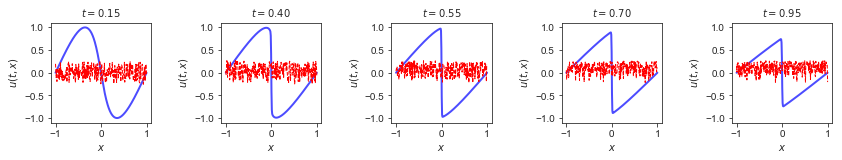

Iter: 500,  discriminator: 1.3703,  generator: 0.0443,  entropy: 0.0277,  posterior: 0.0003,  pde: 0.0162
Iter: 1000,  discriminator: 1.3636,  generator: 0.0712,  entropy: 0.0407,  posterior: 0.0000,  pde: 0.0305
Iter: 1500,  discriminator: 1.3641,  generator: 0.0766,  entropy: 0.0336,  posterior: 0.0000,  pde: 0.0430
Iter: 2000,  discriminator: 1.3364,  generator: 0.1401,  entropy: 0.0786,  posterior: 0.0000,  pde: 0.0616


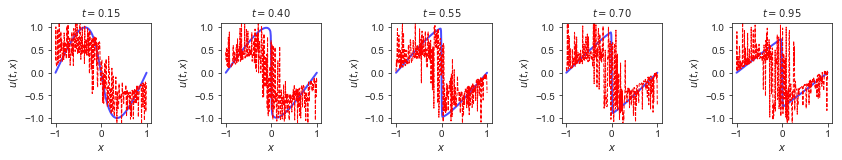

Iter: 2500,  discriminator: 1.3263,  generator: 0.1678,  entropy: 0.0951,  posterior: 0.0000,  pde: 0.0726
Iter: 3000,  discriminator: 1.3462,  generator: 0.2071,  entropy: 0.0624,  posterior: 0.0000,  pde: 0.1447
Iter: 3500,  discriminator: 1.3486,  generator: 0.1710,  entropy: 0.0533,  posterior: 0.0000,  pde: 0.1177
Iter: 4000,  discriminator: 1.3581,  generator: 0.1660,  entropy: 0.0442,  posterior: 0.0000,  pde: 0.1219


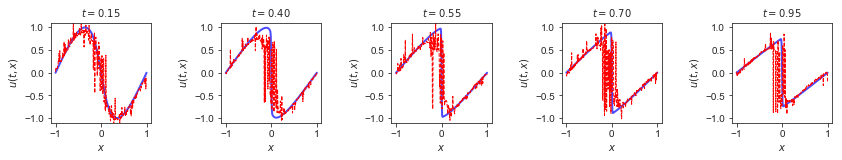

Iter: 4500,  discriminator: 1.3358,  generator: 0.2264,  entropy: 0.0830,  posterior: 0.0000,  pde: 0.1434
Iter: 5000,  discriminator: 1.3367,  generator: 0.2273,  entropy: 0.0846,  posterior: 0.0000,  pde: 0.1428
Iter: 5500,  discriminator: 1.3530,  generator: 0.1270,  entropy: 0.0521,  posterior: 0.0000,  pde: 0.0749
Iter: 6000,  discriminator: 1.3215,  generator: 0.1927,  entropy: 0.0973,  posterior: 0.0000,  pde: 0.0954


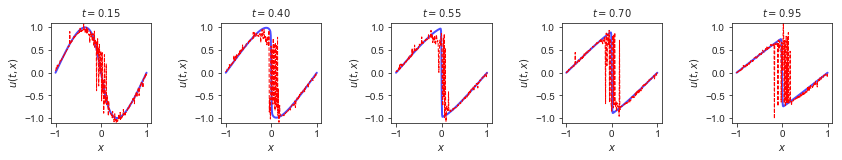

Iter: 6500,  discriminator: 1.3323,  generator: 0.1763,  entropy: 0.0967,  posterior: 0.0000,  pde: 0.0796
Iter: 7000,  discriminator: 1.3305,  generator: 0.1610,  entropy: 0.0942,  posterior: 0.0000,  pde: 0.0668
Iter: 7500,  discriminator: 1.3463,  generator: 0.1233,  entropy: 0.0715,  posterior: 0.0000,  pde: 0.0517
Iter: 8000,  discriminator: 1.3358,  generator: 0.1482,  entropy: 0.0998,  posterior: 0.0000,  pde: 0.0485


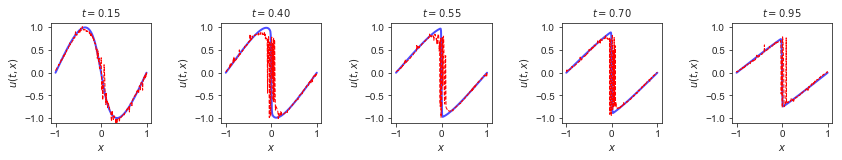

Iter: 8500,  discriminator: 1.3305,  generator: 0.1302,  entropy: 0.0779,  posterior: 0.0000,  pde: 0.0523
Iter: 9000,  discriminator: 1.3207,  generator: 0.1341,  entropy: 0.0956,  posterior: 0.0000,  pde: 0.0385
Iter: 9500,  discriminator: 1.3211,  generator: 0.1439,  entropy: 0.1040,  posterior: 0.0000,  pde: 0.0400
Iter: 10000,  discriminator: 1.3380,  generator: 0.1217,  entropy: 0.0774,  posterior: 0.0000,  pde: 0.0443


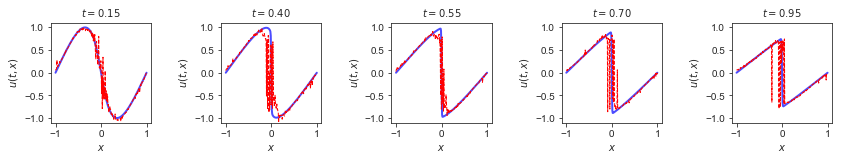

Iter: 10500,  discriminator: 1.3275,  generator: 0.1452,  entropy: 0.0966,  posterior: 0.0000,  pde: 0.0485
Iter: 11000,  discriminator: 1.3078,  generator: 0.1582,  entropy: 0.1277,  posterior: 0.0000,  pde: 0.0305
Iter: 11500,  discriminator: 1.3279,  generator: 0.1565,  entropy: 0.1129,  posterior: 0.0000,  pde: 0.0436
Iter: 12000,  discriminator: 1.3230,  generator: 0.1361,  entropy: 0.0976,  posterior: 0.0000,  pde: 0.0385


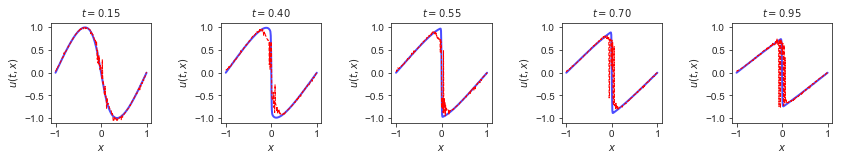

Iter: 12500,  discriminator: 1.3220,  generator: 0.1382,  entropy: 0.0977,  posterior: 0.0000,  pde: 0.0405
Iter: 13000,  discriminator: 1.3037,  generator: 0.1548,  entropy: 0.1139,  posterior: 0.0000,  pde: 0.0409
Iter: 13500,  discriminator: 1.2984,  generator: 0.1679,  entropy: 0.1478,  posterior: 0.0000,  pde: 0.0201


In [7]:
tf.reset_default_graph()

x = tf.placeholder(tf.float32, [None, 1], name='x')
t = tf.placeholder(tf.float32, [None, 1], name='t')

with tf.variable_scope('generator'):
    u_sample = tf.placeholder(tf.float32, [None, latent_var_nb], name='u_sample')
    mlp_config_generator = MLPConfig(layer_size_lst=gen_layer_lst,
                                     activation_lst=gen_activation_lst,
                                     main_name='generator')
    net_pde = create_mlp(tf.concat([x, t, u_sample], 1), mlp_config_generator)
    gen_pde = tf.concat([x, t, net_pde], axis=1, name='gen_pde')
    mlp_config_posterior = MLPConfig(layer_size_lst=pos_layer_lst, 
                                   activation_lst=pos_activation_lst, 
                                   main_name='posterior')
    logits_posterior = create_mlp(gen_pde, mlp_config_posterior)
    net_pde_residuals = net_pde_res_burger(net_pde, x, t)
    
    
with tf.variable_scope('discriminator') as scope:
    u_real = tf.placeholder(tf.float32, [None, 1])
    mlp_config_discriminator = MLPConfig(layer_size_lst=dis_layer_lst, 
                                         activation_lst=dis_activation_lst, 
                                         main_name='discriminator')
    logits_real = create_mlp(tf.concat([x, t, u_real], 1), mlp_config_discriminator)
    scope.reuse_variables()
    logits_fake = create_mlp(gen_pde, mlp_config_discriminator)

dis_loss = discriminator_loss(logits_real, logits_fake)
gen_loss, gen_loss_entropy, gen_loss_posterior, gen_loss_pde = generator_loss(logits_fake, logits_posterior, net_pde_residuals, w_posterior_loss, w_pde_loss)

gen_vars = tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES, scope="generator")
dis_vars = tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES, scope="discriminator")
gen_minimize_step = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=0.9, beta2=0.999, epsilon=1e-08).minimize(gen_loss, var_list=gen_vars)
dis_minimize_step = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=0.9, beta2=0.999, epsilon=1e-08).minimize(dis_loss, var_list=dis_vars)

init = tf.global_variables_initializer()
model_saver = tf.train.Saver()

with tf.Session() as sess:        
    sess.run(init)
    for i in range(iter_nb):
        idx_batch = np.random.choice(u_train.shape[0], batch_size, replace=False)   
        u_real_batch = u_train[idx_batch, :]
        u_sample_batch = np.random.normal(size=(u_real_batch.shape[0], latent_var_nb))
        x_batch = x_train[idx_batch, :]
        t_batch = t_train[idx_batch, :]
        for _ in range(dis_steps_nb):
            run_lst = [dis_minimize_step, dis_loss]
            feed_dict = {u_real: u_real_batch, u_sample: u_sample_batch, x: x_batch, t: t_batch}
            _, d_loss = sess.run(run_lst, feed_dict=feed_dict)

        for _ in range(gen_steps_nb):
            run_lst = [gen_minimize_step, gen_loss, gen_loss_entropy, gen_loss_posterior, gen_loss_pde]
            feed_dict = feed_dict={u_sample: u_sample_batch,  x: x_batch, t: t_batch}
            _, g_loss, g_loss_entropy, g_loss_posterior, g_loss_pde = sess.run(run_lst, feed_dict=feed_dict)
            
        if i==0:
            loss_array = np.array([i,d_loss,g_loss,g_loss_entropy, g_loss_posterior, g_loss_pde])
        if i % 500 == 0:
            str_out = "Iter: %d,  discriminator: %.4f,  generator: %.4f,  entropy: %.4f,  posterior: %.4f,  pde: %.4f"
            print(str_out % (i, d_loss, g_loss, g_loss_entropy, g_loss_posterior, g_loss_pde))
            loss_array = np.vstack((loss_array, np.array([i,d_loss,g_loss,g_loss_entropy, g_loss_posterior, g_loss_pde])))

        if i % 2000 == 0:
            u_test_sample = np.random.normal(size=(u_test.shape[0], latent_var_nb))
            x_gen = sess.run(gen_pde, feed_dict={u_sample: u_test_sample, x: x_test, t: t_test})
            u_pred = griddata(df_data.loc[idx_test,['x', 't']], x_gen[:,2].flatten(), (x_mesh, t_mesh), method='cubic')

            cut_lst = [15, 40, 55, 70, 95]
            fig = plt.figure(figsize=(14,10))
            ax = fig.add_subplot(111)
            ax.axis('off')
            plot_nb = len(cut_lst)
            gs0 = gridspec.GridSpec(1, plot_nb, wspace=0.7)
            for i in range(plot_nb):
                plot_cut_test(grid_spec=gs0[0,i], x=x_data, actual=u_actual, pred=u_pred, cut=cut_lst[i], x_lim=[-1.1,1.1], y_lim=[-1.1,1.1])

            plt.show()
    model_saver.save(sess, os.path.join(path_models, "gan_burger.ckpt"))

### Sampling Distribution

INFO:tensorflow:Restoring parameters from C:\Users\dpapa\Tenokonda Ltd Dropbox\Denis Papaioannou\Tenokonda\80.R&D\20.PhysicsInformed\Repos\gan-pi\resources\models\gan_burger.ckpt


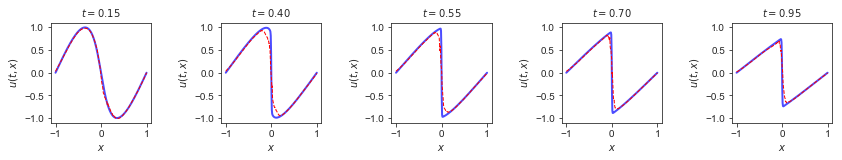

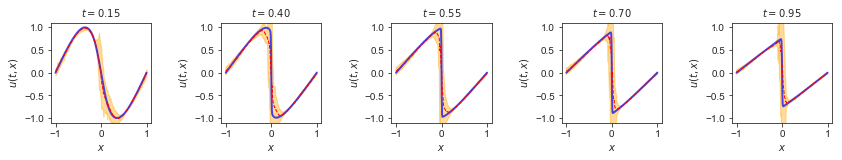

In [10]:
x_gen_mean = None
with tf.Session() as sess:
    saver = tf.train.import_meta_graph(os.path.join(path_models,'gan_burger.ckpt.meta'))
    saver.restore(sess, tf.train.latest_checkpoint(path_models))
    graph = tf.get_default_graph()
    
    u_sample = graph.get_tensor_by_name("generator/u_sample:0")
    x = graph.get_tensor_by_name("x:0")
    t = graph.get_tensor_by_name("t:0")
    
    gen_pde = graph.get_tensor_by_name("generator/gen_pde:0")

    u_sample_test = np.random.normal(size=(u_test.shape[0], latent_var_nb))
    x_gen = sess.run(gen_pde, feed_dict={u_sample: u_sample_test, x: x_test, t: t_test})
    x_gen_array = np.array(x_gen[:,2])
    for i in range(100):
        u_sample_test = np.random.normal(size=(u_test.shape[0], latent_var_nb))
        x_gen = sess.run(gen_pde, feed_dict={u_sample: u_sample_test, x: x_test, t: t_test})
        x_gen_array = np.vstack((x_gen_array, x_gen[:,2]))
    x_gen_mean = np.mean(x_gen_array, axis=0)
    x_gen_std = np.std(x_gen_array, axis=0)
    x_gen[:,2] = x_gen_mean
    
    u_pred = griddata(df_data.loc[idx_test,['x', 't']], x_gen[:,2].flatten(), (x_mesh, t_mesh), method='cubic')
    u_pred_min = griddata(df_data.loc[idx_test,['x', 't']], x_gen_mean - 3.0*x_gen_std, (x_mesh, t_mesh), method='cubic')
    u_pred_max = griddata(df_data.loc[idx_test,['x', 't']], x_gen_mean + 3.0*x_gen_std, (x_mesh, t_mesh), method='cubic')
    cut_lst = [15, 40, 55, 70, 95]
    fig = plt.figure(figsize=(14,10))
    ax = fig.add_subplot(111)
    ax.axis('off')
    plot_nb = len(cut_lst)
    gs0 = gridspec.GridSpec(1, plot_nb, wspace=0.7)
    for i in range(plot_nb):
        plot_cut_test(grid_spec=gs0[0,i], x=x_data, actual=u_actual, pred=u_pred, cut=cut_lst[i], x_lim=[-1.1,1.1], y_lim=[-1.1,1.1])
    plt.show()
    fig = plt.figure(figsize=(14,10))
    ax = fig.add_subplot(111)
    ax.axis('off')
    plot_nb = len(cut_lst)
    gs0 = gridspec.GridSpec(1, plot_nb, wspace=0.7)
    for i in range(plot_nb):
        plot_cut_test_std(grid_spec=gs0[0,i], x=x_data, actual=u_actual, pred=u_pred, pred_min=u_pred_min, pred_max=u_pred_max, cut=cut_lst[i], x_lim=[-1.1,1.1], y_lim=[-1.1,1.1])
    plt.show()

### 3D Actual vs Predicted 

In [11]:
from plotly.offline import plot, iplot, init_notebook_mode
import plotly.graph_objs as go

# Make plotly work with Jupyter notebook
init_notebook_mode()

pred = go.Scatter3d(
    x = df_data.t,
    y = df_data.x,
    z = u_pred.flatten(),
    marker = go.Marker(color='red', size=1.5),
    mode = 'markers'
)

actual = go.Scatter3d(
    x = df_data.t,
    y = df_data.x,
    z = df_data.u,
    marker = go.Marker(color='blue', size=1.5),
    mode = 'markers'
)

data = go.Data([pred, actual])

iplot(data)

C:\Users\dpapa\AppData\Local\conda\conda\envs\tensorflow_env\lib\site-packages\plotly\graph_objs\_deprecations.py:426: DeprecationWarning:

plotly.graph_objs.Marker is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Marker
  - plotly.graph_objs.histogram.selected.Marker
  - etc.


C:\Users\dpapa\AppData\Local\conda\conda\envs\tensorflow_env\lib\site-packages\plotly\graph_objs\_deprecations.py:39: DeprecationWarning:

plotly.graph_objs.Data is deprecated.
Please replace it with a list or tuple of instances of the following types
  - plotly.graph_objs.Scatter
  - plotly.graph_objs.Bar
  - plotly.graph_objs.Area
  - plotly.graph_objs.Histogram
  - etc.




### Loss Functions

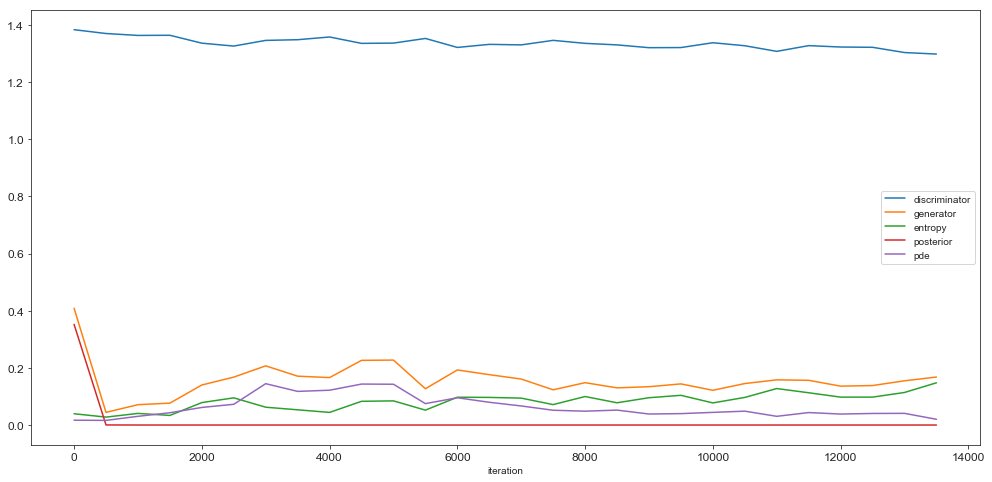

In [12]:
df_loss = pd.DataFrame(loss_array, columns=['iteration', 'discriminator', 'generator', 'entropy', 'posterior', 'pde'])
# df.plot(x=df.iteration, y=df.columns[1:], figsize=(17,8), fontsize=12)
df_loss.iteration = df_loss.iteration.astype(int)
df_loss.set_index(df_loss.iteration, inplace=True)
df_loss.drop(['iteration'], axis=1, inplace=True)
df_loss.plot(figsize=(17,8), fontsize=12)